In [18]:
import matplotlib.pyplot as plt
import numpy as np
from matplotlib.colors import LogNorm


In [19]:
duration_max = 24*70 # hours

In [ ]:
time = np.linspace(10, 3600*duration_max, 1000)
fom = np.logspace(-3, 0, 1000)
sigma = 1 * np.sqrt(1 / (time * fom))

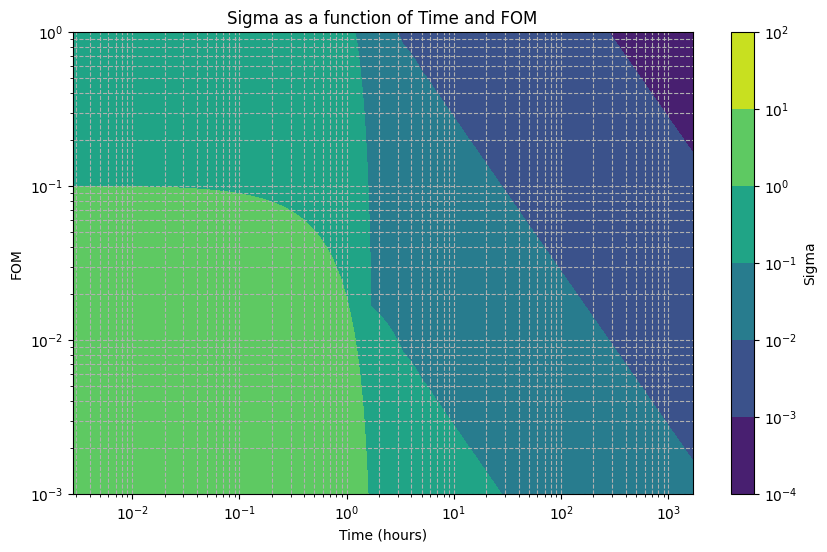

In [21]:
# create a meshgrid for time and fom
T, F = np.meshgrid(time, fom)
# calculate sigma for each combination
sigma_2d = np.sqrt(1 / (T * F))

plt.figure(figsize=(10, 6))
contour = plt.contourf(T / 3600, F, sigma_2d, levels=1, cmap='viridis', norm=LogNorm(), origin='upper')
plt.colorbar(contour, label='Sigma')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Time (hours)')
plt.ylabel('FOM')
plt.title('Sigma as a function of Time and FOM')
plt.grid(True, which="both", ls="--")
plt.show()

In [22]:
import plotly.graph_objects as go
import numpy as np

fig = go.Figure(data=go.Heatmap(
    z=np.log10(sigma_2d),
    x=T[0] / 3600,  # Time (hours)
    y=F[:, 0],      # FOM
    colorscale='Viridis',
    colorbar=dict(
        title='Sigma',
        tickvals=np.log10([1e-2, 1e-1, 1, 10]),
        ticktext=['0.01', '0.1', '1', '10']
    ),
))
fig.update_layout(
    xaxis_type='linear',
    yaxis_type='log',
    xaxis_title='Time (hours)',
    yaxis_title='FOM',
    title='Sigma as a function of Time and FOM (log color scale)'
)
fig.show()


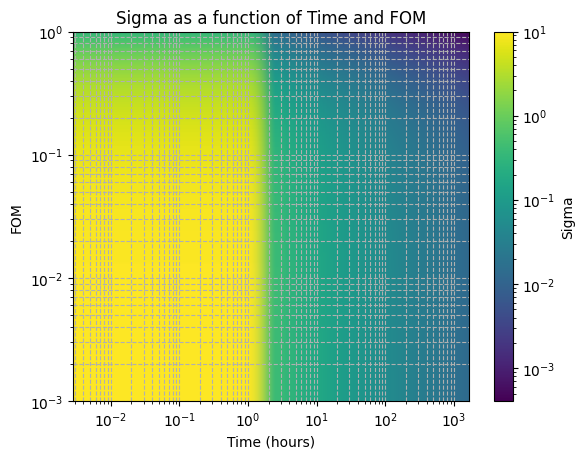

In [23]:
plt.imshow(sigma_2d, extent=(time.min()/3600, time.max()/3600, fom.min(), fom.max()), aspect='auto', origin='lower', norm=LogNorm())
plt.colorbar(label='Sigma')
plt.xscale('log')
plt.yscale('log')
plt.xlabel('Time (hours)')
plt.ylabel('FOM')
plt.title('Sigma as a function of Time and FOM')
plt.grid(True, which="both", ls="--")
plt.show()

In [24]:
np.max(sigma_2d)

np.float64(10.0)

t =    10 s -> erreur relative = 141.42 %
t =   100 s -> erreur relative = 44.72 %
t =  1000 s -> erreur relative = 14.14 %


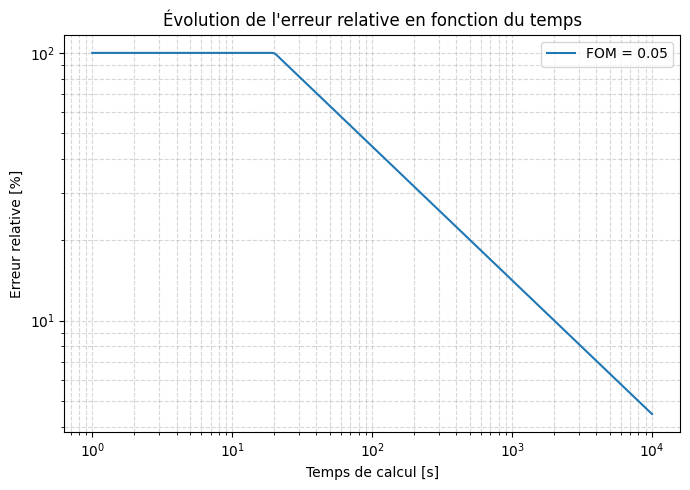

In [27]:

# --- Paramètres ---
FOM = 5.0e-2  # exemple : FOM = 5 (à ajuster selon ton cas)
t = np.logspace(0, 4, 200)  # temps de 1 à 10^4 secondes

# --- Calcul de l'erreur relative ---
R = 1 / np.sqrt(FOM * t)
R[R > 1] = 1  # l'erreur relative ne peut pas dépasser 100%
# --- Affichage de quelques valeurs ---
for ti, Ri in zip([10, 100, 1000], 1/np.sqrt(FOM * np.array([10, 100, 1000]))):
    print(f"t = {ti:>5.0f} s -> erreur relative = {Ri*100:.2f} %")

# --- Tracé ---
plt.figure(figsize=(7,5))
plt.loglog(t, R*100, label=f'FOM = {FOM}')
plt.xlabel('Temps de calcul [s]')
plt.ylabel('Erreur relative [%]')
plt.title('Évolution de l\'erreur relative en fonction du temps')
plt.grid(True, which='both', ls='--', alpha=0.5)
plt.legend()
plt.tight_layout()
plt.show()